# 第三章-聚类模型

## 0 远程拉取项目

In [ ]:
# ===== 第 0 步：初始化项目（学生无需理解） =====
import os

REPO_NAME = "sjtu-ML"
REPO_URL  = "https://github.com/sihaobao/sjtu-ML.git"

# 1. 如果仓库不存在，则 clone
if not os.path.exists(f"/content/{REPO_NAME}"):
    !git clone {REPO_URL}

# 2. 切换到仓库根目录
os.chdir(f"/content/{REPO_NAME}")

# 3. 切换到当前实验目录（数据就在这里）
os.chdir("第三章-聚类模型")

print("✅ 当前工作目录：", os.getcwd())
print("✅ 当前目录文件：", os.listdir("."))

## 1 K-means聚类

### 1.1 代码介绍（流程）

In [1]:
# 1. 初始化设置

# 导入必要的库
import pandas as pd  # 处理表格型数据的核心库
import numpy as np   # 数值计算库
import matplotlib.pyplot as plt   #绘图

# 设置中文字体
plt.rcParams['font.sans-serif'] = ['SimHei']  # 可以根据系统情况替换为其他支持中文的字体
# 解决负号显示问题
plt.rcParams['axes.unicode_minus'] = False

In [2]:
# 2. 数据读取

# 数据读取函数
def read_data(file_path):
    """
    读取数据文件
    参数:
    file_path (str): 数据文件路径
    返回:
    df (DataFrame): 读取的数据
    """
    df = pd.read_csv(file_path)
    return df

#读取数据
file_path = 'solar2013.csv'
data = read_data(file_path)

# 查看数据集基本信息
print("="*50)
print("查看数据集前15行：")
print(data.head(15))

查看数据集前15行：
         TIMESTAMP     POWER
0    2013/1/1 0:00  0.000000
1    2013/1/1 1:00  0.000000
2    2013/1/1 2:00  0.000000
3    2013/1/1 3:00  0.000000
4    2013/1/1 4:00  0.000000
5    2013/1/1 5:00  0.000000
6    2013/1/1 6:00  0.000000
7    2013/1/1 7:00  0.000000
8    2013/1/1 8:00  0.000000
9    2013/1/1 9:00  0.014679
10  2013/1/1 10:00  0.251923
11  2013/1/1 11:00  0.615385
12  2013/1/1 12:00  0.743782
13  2013/1/1 13:00  0.780064
14  2013/1/1 14:00  0.779744


In [13]:
# 3. 蒙特卡洛场景生成

# 蒙特卡洛场景生成函数
def monte_carlo_scene_generation(data, num_days):
    """
    基于蒙特卡洛方法生成场景

    参数:
    data (DataFrame): 原始数据
    num_days (int): 要生成的天数

    返回:
    scenarios (ndarray): 生成的场景数据，形状为 (num_days, 24)
    """
    # 数据是按天排列，每天 24 个点，提取功率列
    power_data = data['POWER'].values
    # 按天分割数据
    daily_data = [power_data[i:i + 24] for i in range(0, len(power_data), 24)]
    daily_data = np.array(daily_data)

    # 获取数据的统计特征（均值和标准差）
    means = np.mean(daily_data, axis=0)
    stds = np.std(daily_data, axis=0)

    # 生成随机场景
    scenarios = np.random.normal(loc=means, scale=stds, size=(num_days, 24))
    return scenarios

# 蒙特卡洛场景生成
num_days = 500  # 蒙特卡洛生成的天数
scenarios = monte_carlo_scene_generation(data, num_days)

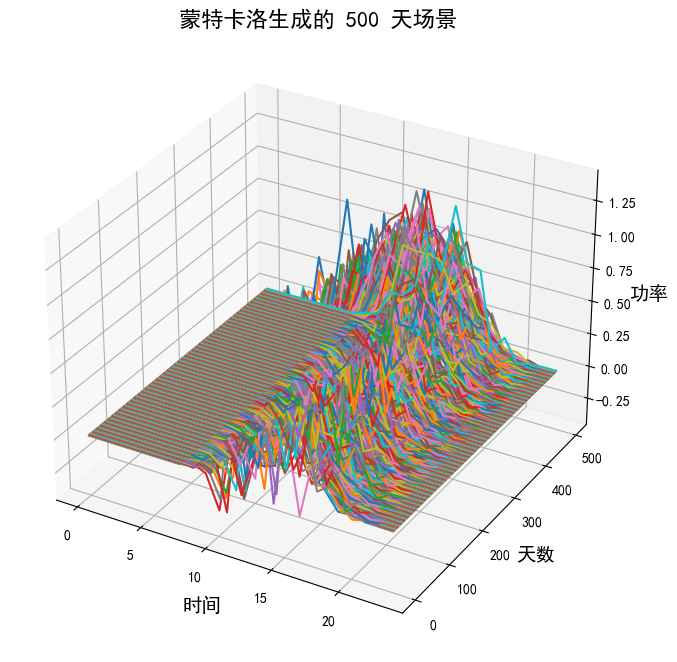

In [14]:
# 3. 蒙特卡洛场景生成
# 可视化代码

# 绘制三维图
def plot_3d(scenarios, title):
    """
    绘制三维图

    参数:
    scenarios (ndarray): 场景数据，形状为 (num_days, 24)
    title (str): 图的标题
    """
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    num_days = scenarios.shape[0]
    for day in range(num_days):
        x = np.arange(24)  # 时间（24 个点）
        y = np.full(24, day)  # 天数
        z = scenarios[day]  # 功率
        ax.plot(x, y, z)

    ax.set_xlabel('时间', fontsize=14)
    ax.set_ylabel('天数', fontsize=14)
    ax.set_zlabel('功率', fontsize=14)
    ax.set_title(title, fontsize=16)
    plt.show()
    
# 绘制生成的场景的三维图
plot_3d(scenarios, '蒙特卡洛生成的 500 天场景')

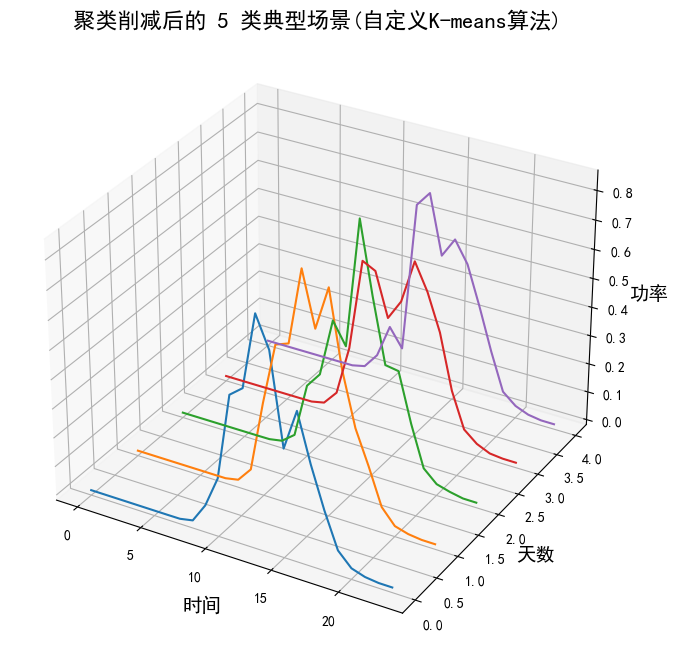

In [15]:
# 4. 自定义的 K-means 算法实现

#自定义的K-means聚类算法函数
def custom_kmeans(scenarios, num_clusters, max_iterations=100, tolerance=1e-4):
    """
    自定义的 K-means 聚类算法

    参数:
    scenarios (ndarray): 输入的场景数据，形状为 (num_scenarios, num_features)
    num_clusters (int): 聚类的数量
    max_iterations (int): 最大迭代次数
    tolerance (float): 聚类中心变化的阈值，用于判断收敛

    返回:
    centroids (ndarray): 最终的聚类中心，形状为 (num_clusters, num_features)
    labels (ndarray): 每个数据点所属的聚类标签，形状为 (num_scenarios,)
    """
    num_scenarios, num_features = scenarios.shape

    # 随机初始化聚类中心
    np.random.seed(42)
    centroids = scenarios[np.random.choice(num_scenarios, num_clusters, replace=False)]

    for _ in range(max_iterations):
        # 计算每个数据点到各个聚类中心的距离
        distances = np.sqrt(((scenarios[:, np.newaxis] - centroids) ** 2).sum(axis=2))

        # 将每个数据点分配到最近的聚类中心
        labels = np.argmin(distances, axis=1)

        old_centroids = centroids.copy()

        # 更新聚类中心
        for i in range(num_clusters):
            cluster_points = scenarios[labels == i]
            if len(cluster_points) > 0:
                centroids[i] = cluster_points.mean(axis=0)

        # 检查聚类中心是否收敛
        center_shift = np.sqrt(((centroids - old_centroids) ** 2).sum())
        if center_shift < tolerance:
            break

    return centroids, labels

# K-means聚类
num_reduced_scenarios = 5  # 削减后保留的场景数量
reduced_scenarios1, labels1 = custom_kmeans(scenarios, num_reduced_scenarios, max_iterations=100, tolerance=1e-4)

# 绘制削减后的场景的三维图
plot_3d(reduced_scenarios1, '聚类削减后的 5 类典型场景(自定义K-means算法)')

In [16]:
# 5. 计算每个场景的概率

# 计算每个场景概率的函数
def calculate_scenario_probabilities(labels, num_reduced_scenarios):
    """
    计算每个场景的概率

    参数:
    labels (ndarray): 每个数据点所属的聚类标签
    num_reduced_scenarios (int): 削减后要保留的场景数量

    返回:
    probabilities (ndarray): 每个场景的概率
    """
    num_samples = len(labels)
    probabilities = np.zeros(num_reduced_scenarios)
    for i in range(num_reduced_scenarios):
        # 统计每个簇中的样本数量
        cluster_count = np.sum(labels == i)
        # 计算每个场景的概率
        probabilities[i] = cluster_count / num_samples
    return probabilities

# labels1 是聚类后得到的标签，num_reduced_scenarios 是 5
probs = calculate_scenario_probabilities(labels1, num_reduced_scenarios)

# 2打印结果
print("\n" + "="*30)
print("典型场景概率计算结果(自定义K-means算法)：")
print("-" * 30)
for i, p in enumerate(probs):
    # i+1 是为了让场景从 1 开始计数
    # :.2% 表示将小数转换为百分数并保留两位小数
    # :.4f 表示保留四位小数
    print(f"典型场景 {i+1} 的发生概率为: {p:.2%} (数值: {p:.4f})")
print("="*30)


典型场景概率计算结果(自定义K-means算法)：
------------------------------
典型场景 1 的发生概率为: 19.40% (数值: 0.1940)
典型场景 2 的发生概率为: 19.80% (数值: 0.1980)
典型场景 3 的发生概率为: 17.80% (数值: 0.1780)
典型场景 4 的发生概率为: 19.20% (数值: 0.1920)
典型场景 5 的发生概率为: 23.80% (数值: 0.2380)


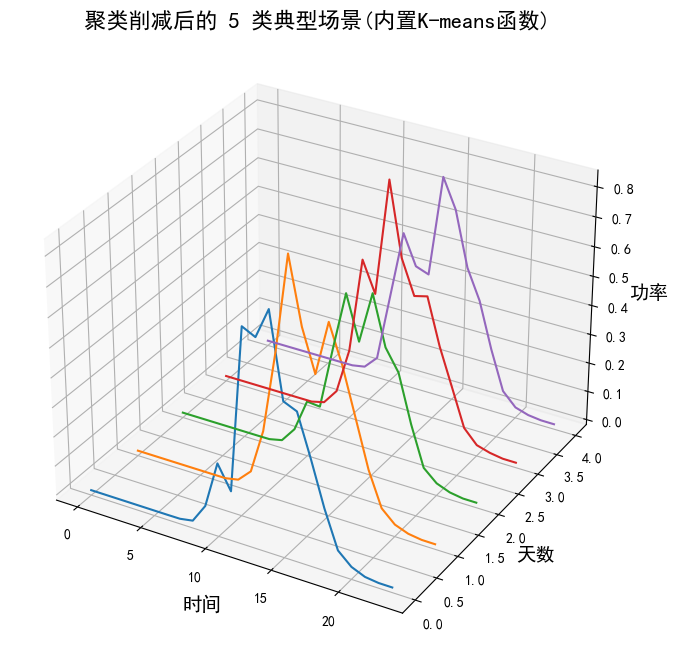

In [17]:
# 6. 直接调用 K-means 算法函数

from sklearn.cluster import KMeans
"""
参数:
n_clusters:指定要形成的聚类(簇)的数量
random_state:在初始化聚类中心时通常会随机选择数据点作为初始中心
"""
kmeans = KMeans(n_clusters=num_reduced_scenarios, random_state=42)

# 拟合数据
kmeans.fit(scenarios)

# 获取聚类中心（即削减后的典型场景）和标签
reduced_scenarios2 = kmeans.cluster_centers_
labels2 = kmeans.labels_

# 绘制结果
plot_3d(reduced_scenarios2, '聚类削减后的 5 类典型场景(内置K-means函数)')

In [18]:
# 7. 计算每个场景的概率

# 计算每个场景概率的函数
def calculate_scenario_probabilities(labels, num_reduced_scenarios):
    """
    计算每个场景的概率

    参数:
    labels (ndarray): 每个数据点所属的聚类标签
    num_reduced_scenarios (int): 削减后要保留的场景数量

    返回:
    probabilities (ndarray): 每个场景的概率
    """
    num_samples = len(labels)
    probabilities = np.zeros(num_reduced_scenarios)
    for i in range(num_reduced_scenarios):
        # 统计每个簇中的样本数量
        cluster_count = np.sum(labels == i)
        # 计算每个场景的概率
        probabilities[i] = cluster_count / num_samples
    return probabilities

# labels1 是聚类后得到的标签，num_reduced_scenarios 是 5
probs = calculate_scenario_probabilities(labels2, num_reduced_scenarios)

# 2打印结果
print("\n" + "="*30)
print("典型场景概率计算结果(内置K-means函数)：")
print("-" * 30)
for i, p in enumerate(probs):
    # i+1 是为了让场景从 1 开始计数
    # :.2% 表示将小数转换为百分数并保留两位小数
    # :.4f 表示保留四位小数
    print(f"典型场景 {i+1} 的发生概率为: {p:.2%} (数值: {p:.4f})")
print("="*30)


典型场景概率计算结果(内置K-means函数)：
------------------------------
典型场景 1 的发生概率为: 18.80% (数值: 0.1880)
典型场景 2 的发生概率为: 18.80% (数值: 0.1880)
典型场景 3 的发生概率为: 19.80% (数值: 0.1980)
典型场景 4 的发生概率为: 20.80% (数值: 0.2080)
典型场景 5 的发生概率为: 21.80% (数值: 0.2180)


=== 初始化聚类中心及初始分配 ===


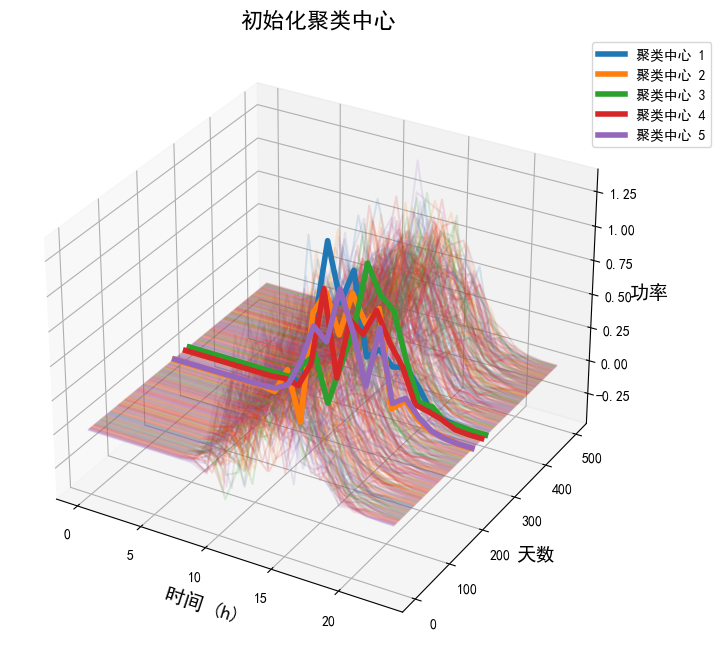

--------------------------------------------------
=== 第 1 次迭代 ===
当前聚类中心总偏移量: 1.035712


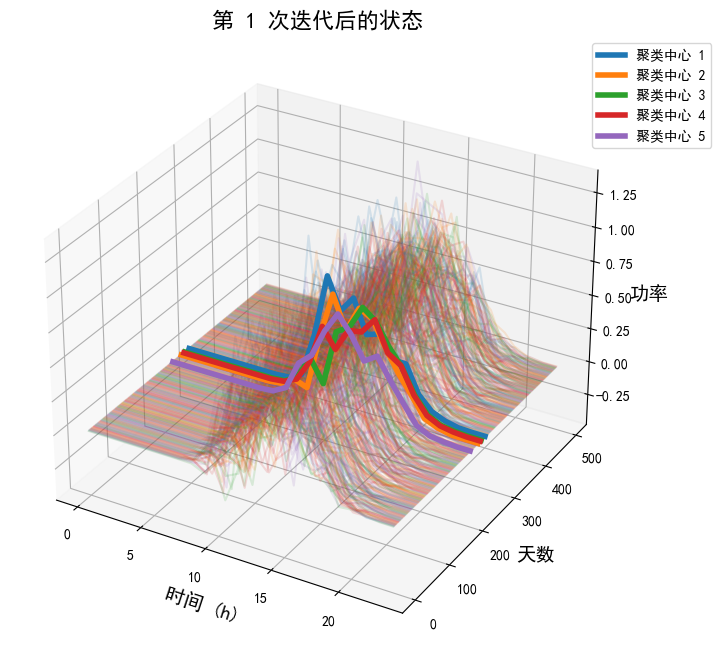

--------------------------------------------------
=== 第 2 次迭代 ===
当前聚类中心总偏移量: 0.181999


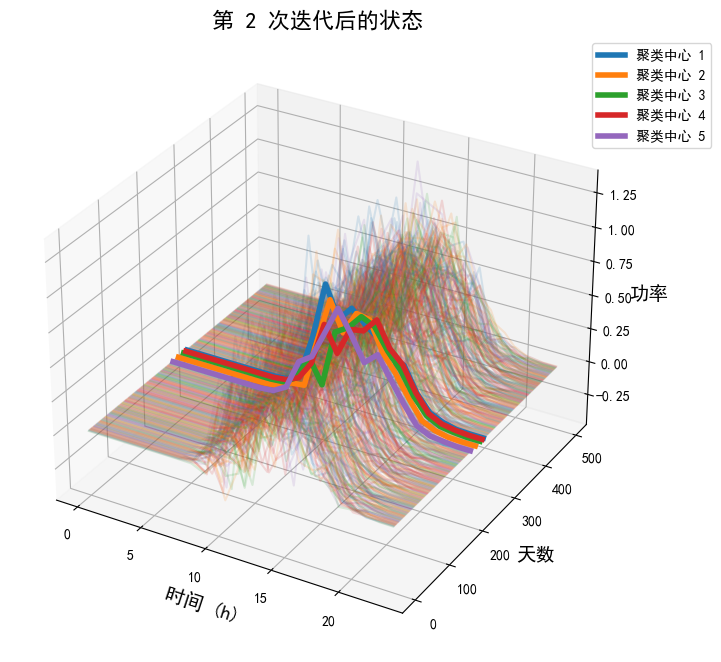

--------------------------------------------------
=== 第 3 次迭代 ===
当前聚类中心总偏移量: 0.123249


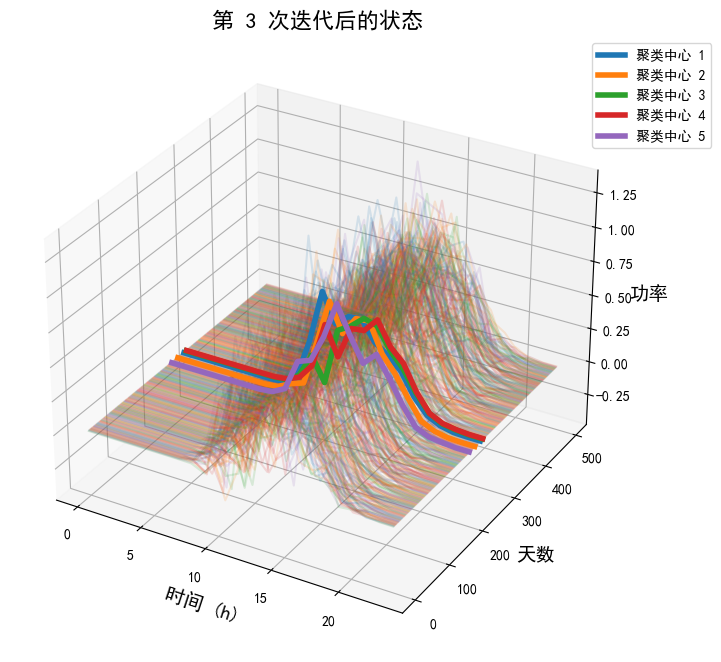

--------------------------------------------------
=== 第 4 次迭代 ===
当前聚类中心总偏移量: 0.077979


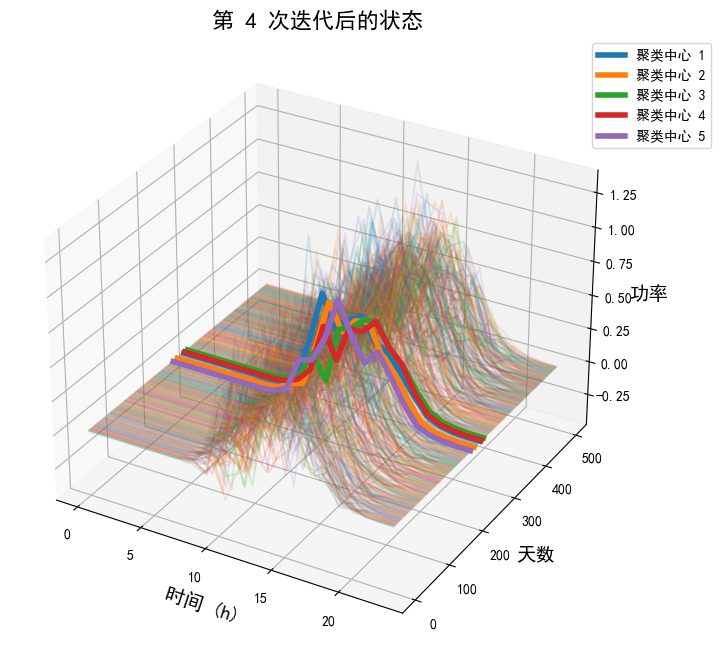

--------------------------------------------------
=== 第 5 次迭代 ===
当前聚类中心总偏移量: 0.059611


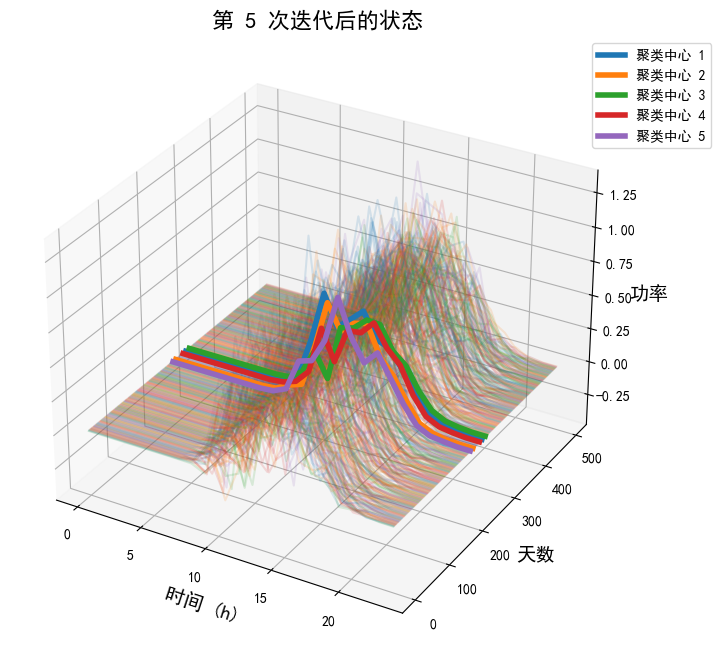

--------------------------------------------------
=== 第 6 次迭代 ===
当前聚类中心总偏移量: 0.057802


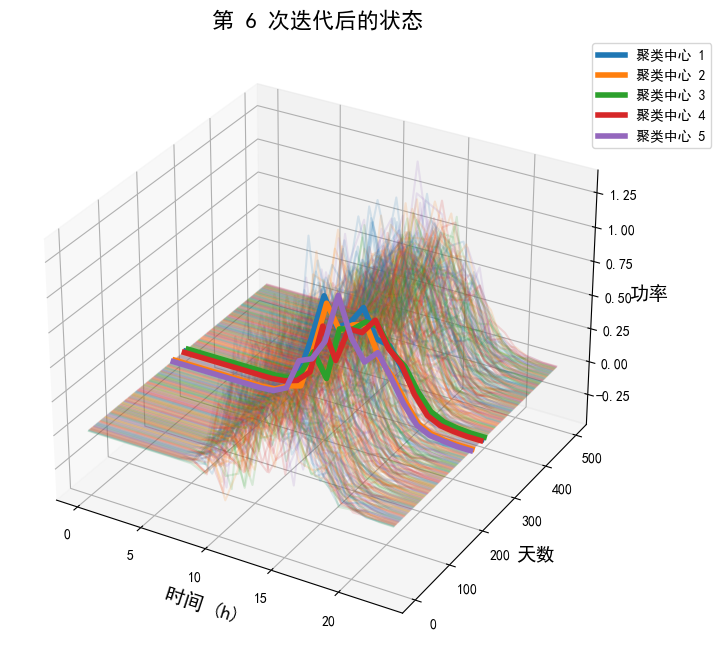

--------------------------------------------------
=== 第 7 次迭代 ===
当前聚类中心总偏移量: 0.034785


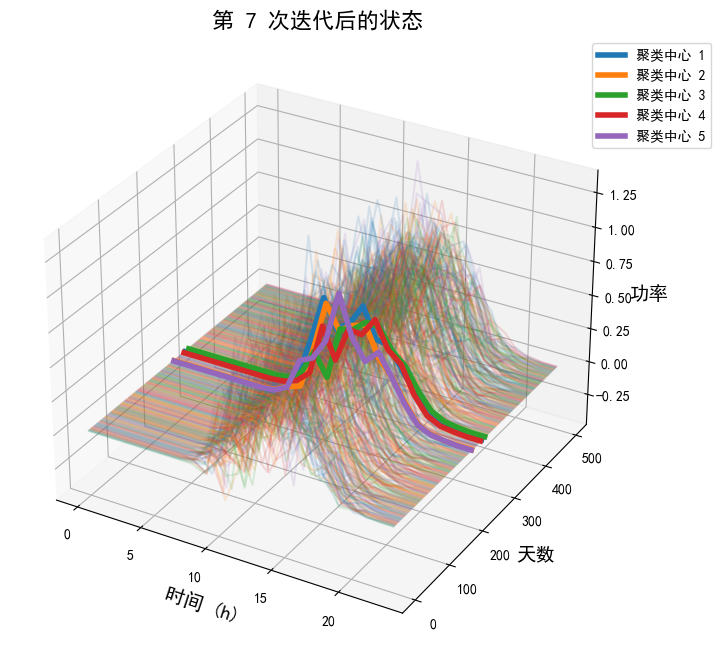

--------------------------------------------------
=== 第 8 次迭代 ===
当前聚类中心总偏移量: 0.033928


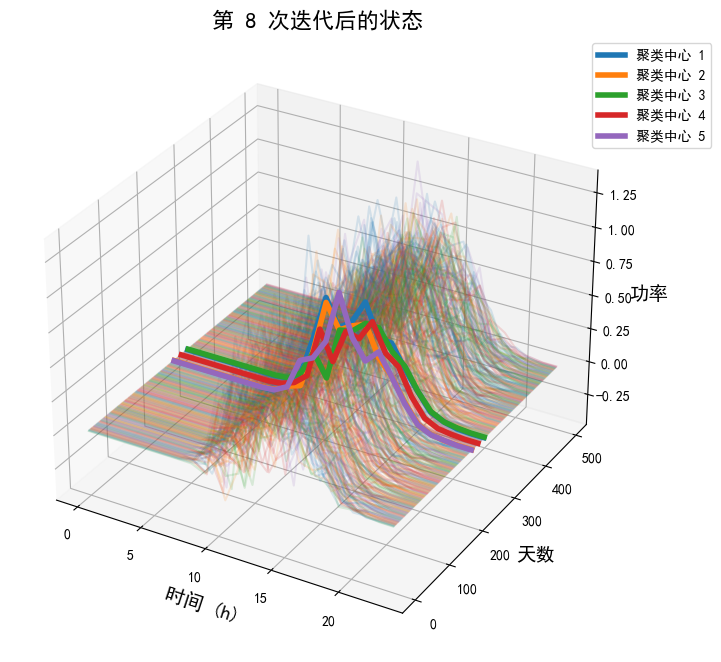

--------------------------------------------------
=== 第 9 次迭代 ===
当前聚类中心总偏移量: 0.039662


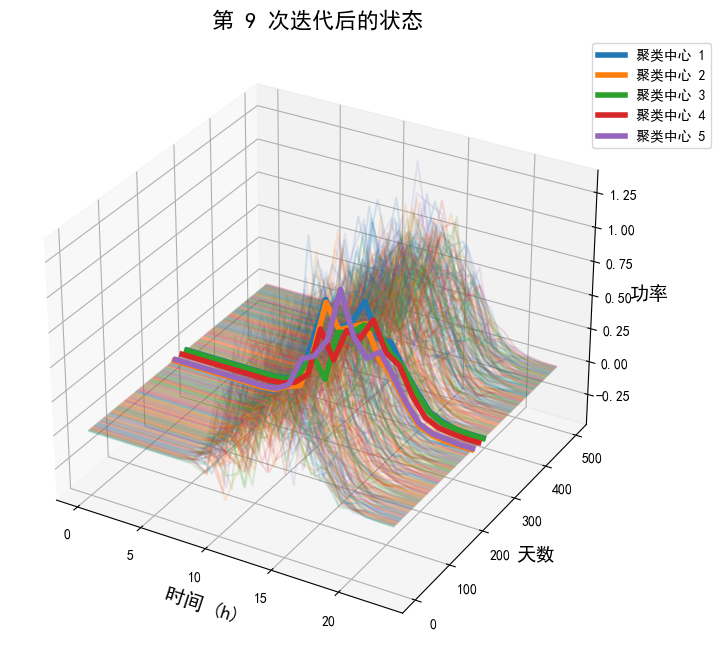

--------------------------------------------------
=== 第 10 次迭代 ===
当前聚类中心总偏移量: 0.027071


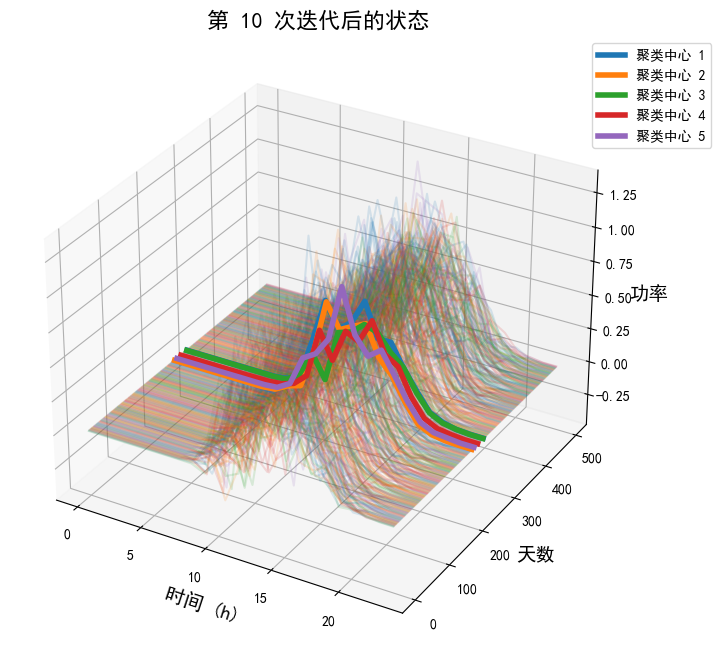

--------------------------------------------------
=== 第 11 次迭代 ===
当前聚类中心总偏移量: 0.028218


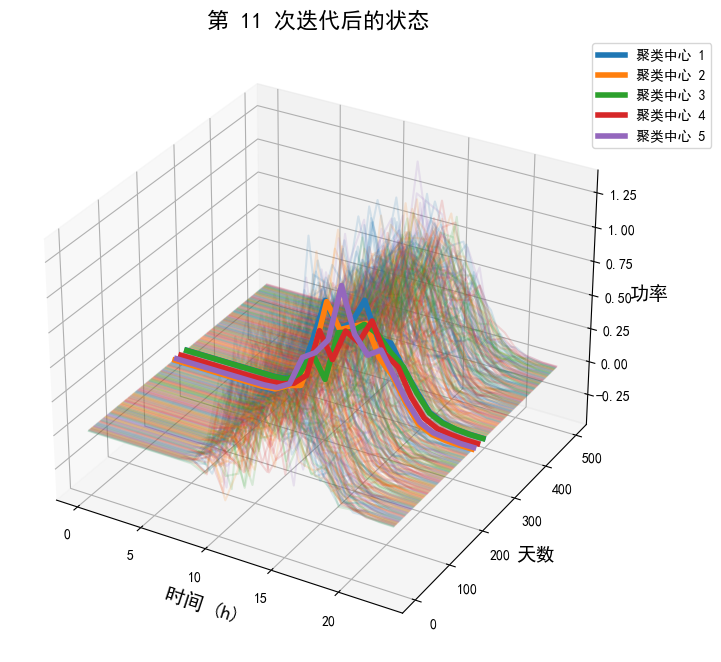

--------------------------------------------------
=== 第 12 次迭代 ===
当前聚类中心总偏移量: 0.025027


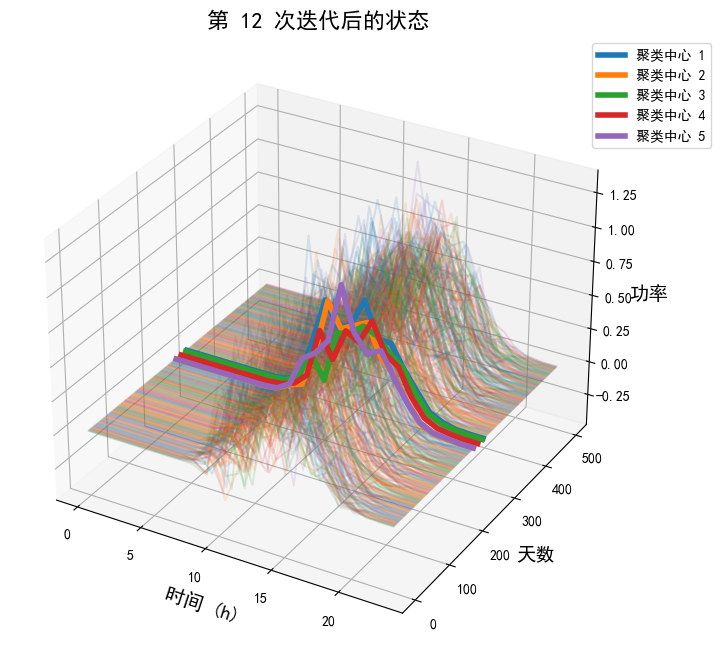

--------------------------------------------------
=== 第 13 次迭代 ===
当前聚类中心总偏移量: 0.017589


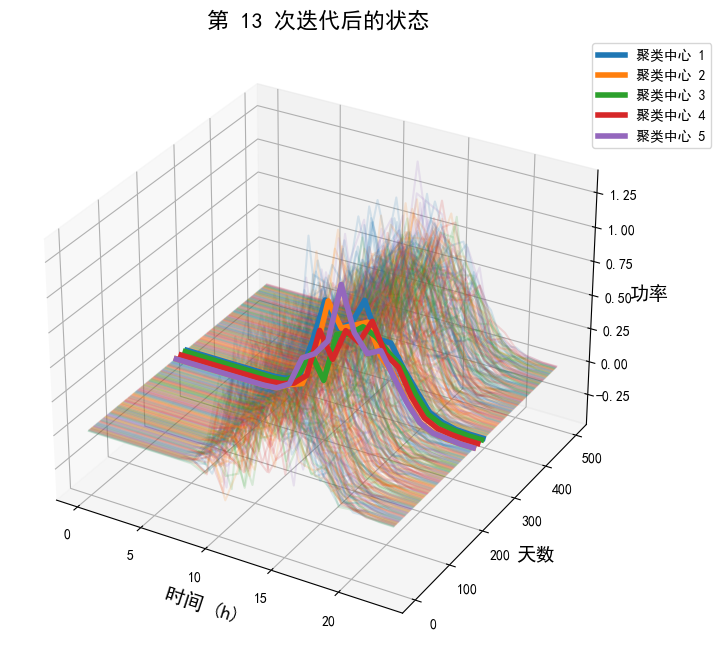

--------------------------------------------------
=== 第 14 次迭代 ===
当前聚类中心总偏移量: 0.004779


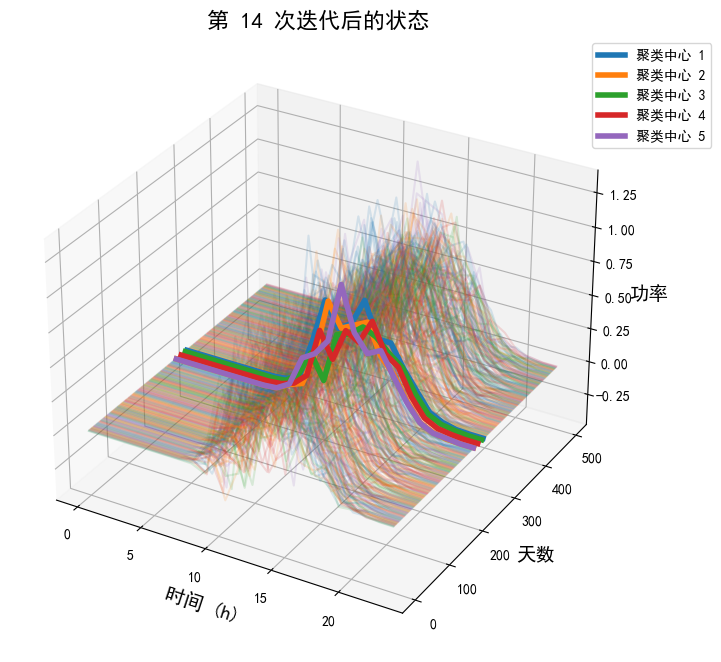

--------------------------------------------------
=== 第 15 次迭代 ===
当前聚类中心总偏移量: 0.000000


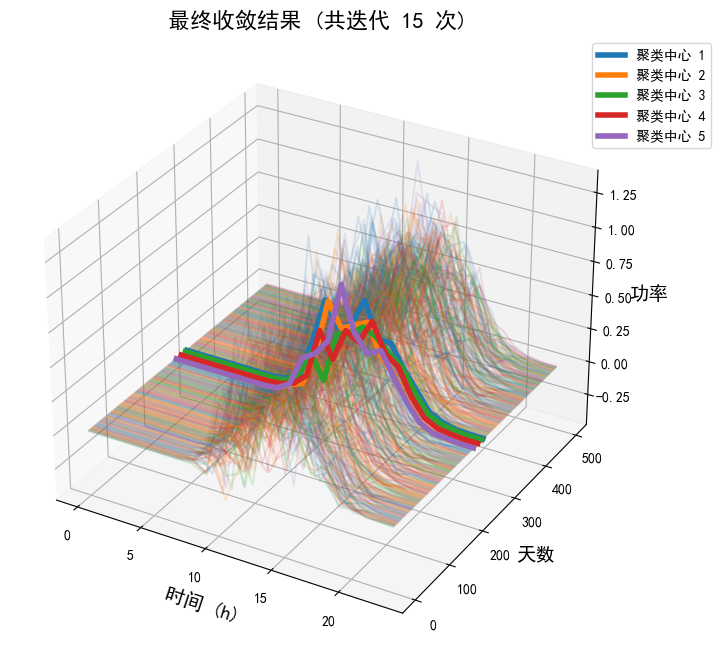


🎉 算法在第 15 次迭代后达到收敛标准（偏移量 < 0.0001）！


In [10]:
# 8. 展示 K-means 聚类中间流程

# 三维绘图函数：同时展示 500 条曲线和聚类中心
def plot_3d_clusters(all_scenarios, labels, centroids, title):
    """
    在三维图中同时绘制所有场景（按聚类染色、半透明）和聚类中心（实线加粗）
    """
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')

    num_days = all_scenarios.shape[0]
    num_clusters = centroids.shape[0]

    # 获取颜色图表 (推荐使用 tab10 或 Set1，颜色对比鲜明)
    colors = plt.cm.tab10(np.linspace(0, 1, max(10, num_clusters)))

    # 1. 画 500 条原始曲线 (带透明度)
    for day in range(num_days):
        cluster_idx = labels[day]
        x = np.arange(24)
        y = np.full(24, day)
        z = all_scenarios[day]
        # 设置较低的透明度 alpha=0.15 避免遮挡聚类中心
        ax.plot(x, y, z, color=colors[cluster_idx], alpha=0.15)

    # 2. 画聚类中心 (实线，加粗，凸显)
    for i in range(num_clusters):
        x = np.arange(24)
        
        # 寻找属于该聚类的所有天数索引
        cluster_indices = np.where(labels == i)[0]
        
        # 为了让聚类中心在 3D 图中看起来处于该簇的中间
        # 我们将其 Y 坐标设为该簇天数的平均值
        if len(cluster_indices) > 0:
            y_pos = np.mean(cluster_indices)
        else:
            y_pos = 0

        y = np.full(24, y_pos)
        z = centroids[i]
        
        # 使用同色，但 alpha=1.0 且加粗线条
        ax.plot(x, y, z, color=colors[i], linewidth=4, alpha=1.0, label=f'聚类中心 {i+1}')

    ax.set_xlabel('时间 (h)', fontsize=14)
    ax.set_ylabel('天数', fontsize=14)
    ax.set_zlabel('功率', fontsize=14)
    ax.set_title(title, fontsize=16)
    
    # 提取图例 (只显示聚类中心，不显示 500 条普通曲线)
    handles, legend_labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(handles, legend_labels, loc='upper right', bbox_to_anchor=(1.15, 1))
        
    plt.show()

# 改进后的带可视化过程的自定义 K-means 算法
def custom_kmeans_with_visualization(scenarios, num_clusters, max_iterations=100, tolerance=1e-4):
    num_scenarios, num_features = scenarios.shape

    # 随机初始化聚类中心
    np.random.seed(42)
    centroids = scenarios[np.random.choice(num_scenarios, num_clusters, replace=False)]
    
    # 为了第一张图能上色，先计算一次初始分配
    distances = np.sqrt(((scenarios[:, np.newaxis] - centroids) ** 2).sum(axis=2))
    labels = np.argmin(distances, axis=1)
    
    print("=== 初始化聚类中心及初始分配 ===")
    plot_3d_clusters(scenarios, labels, centroids, '初始化聚类中心')
    
    for iteration in range(max_iterations):
        old_centroids = centroids.copy()

        # 更新聚类中心
        for i in range(num_clusters):
            cluster_points = scenarios[labels == i]
            if len(cluster_points) > 0:
                centroids[i] = cluster_points.mean(axis=0)

        # 计算更新后的中心点与所有数据点的距离，重新分配标签
        distances = np.sqrt(((scenarios[:, np.newaxis] - centroids) ** 2).sum(axis=2))
        new_labels = np.argmin(distances, axis=1)

        # 检查聚类中心是否收敛 (总偏移量)
        center_shift = np.sqrt(((centroids - old_centroids) ** 2).sum())
        
        # 更新标签
        labels = new_labels
        
        # --- 打印当前迭代的过程图 ---
        
        print("-" * 50)
        print(f"=== 第 {iteration + 1} 次迭代 ===")
        print(f"当前聚类中心总偏移量: {center_shift:.6f}")
        
        if center_shift < tolerance:
            plot_3d_clusters(scenarios, labels, centroids, f'最终收敛结果 (共迭代 {iteration + 1} 次)')
            print(f"\n🎉 算法在第 {iteration + 1} 次迭代后达到收敛标准（偏移量 < {tolerance}）！")
            break
        else:
            plot_3d_clusters(scenarios, labels, centroids, f'第 {iteration + 1} 次迭代后的状态')

    return centroids, labels

# ================= 运行可视化聚类 =================

num_reduced_scenarios = 5  # 削减后保留的场景数量

# 调用带可视化的 K-means
reduced_scenarios1, labels1 = custom_kmeans_with_visualization(
    scenarios, 
    num_reduced_scenarios, 
    max_iterations=100, 
    tolerance=1e-4
)

### 1.2 优化分析

正在计算不同 K 值下的 SSE...


C:\Users\Lenovo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


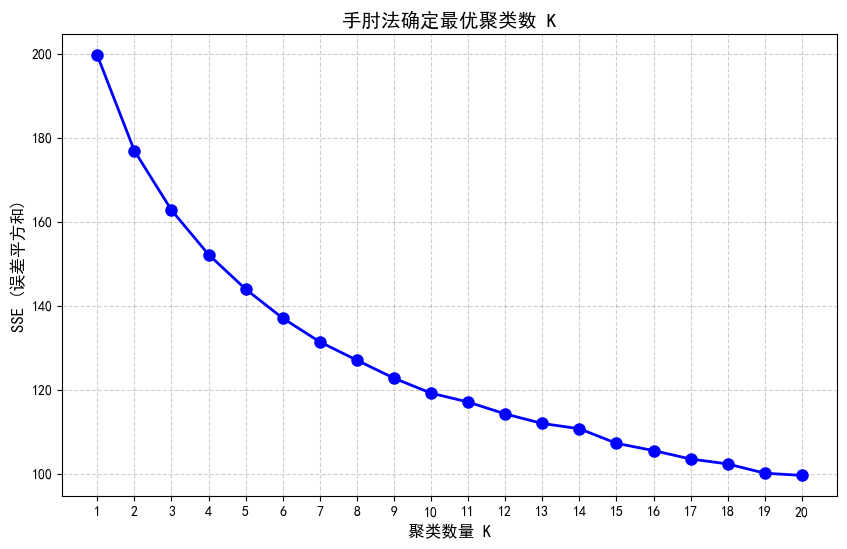


K 值对应的 SSE 变化：
K 从 1 增加到 2, SSE 下降了: 22.71
K 从 2 增加到 3, SSE 下降了: 14.14
K 从 3 增加到 4, SSE 下降了: 10.57
K 从 4 增加到 5, SSE 下降了: 8.24
K 从 5 增加到 6, SSE 下降了: 6.92
K 从 6 增加到 7, SSE 下降了: 5.64
K 从 7 增加到 8, SSE 下降了: 4.37
K 从 8 增加到 9, SSE 下降了: 4.28
K 从 9 增加到 10, SSE 下降了: 3.56
K 从 10 增加到 11, SSE 下降了: 2.12
K 从 11 增加到 12, SSE 下降了: 2.83
K 从 12 增加到 13, SSE 下降了: 2.27
K 从 13 增加到 14, SSE 下降了: 1.25
K 从 14 增加到 15, SSE 下降了: 3.47
K 从 15 增加到 16, SSE 下降了: 1.73
K 从 16 增加到 17, SSE 下降了: 2.01
K 从 17 增加到 18, SSE 下降了: 1.17
K 从 18 增加到 19, SSE 下降了: 2.21
K 从 19 增加到 20, SSE 下降了: 0.52


In [19]:
# 优化分析——手肘法确定聚类数K

# “手肘法”寻找最优 K 值函数
def find_optimal_k(scenarios, max_k=None):
    """
    使用手肘法计算不同 K 值下的 SSE，并绘制曲线
    
    参数:
    scenarios (ndarray): 输入的场景数据
    max_k (int): 最大尝试的 K 值，若为 None 则自动设为 sqrt(N)
    """
    num_samples = 500
    
    # 按照建议，K 值最大不超过样本量的开平方根
    if max_k is None:
        max_k = int(np.sqrt(num_samples))
        # 限制一个合理的上限，防止计算量过大（例如 15 或 20）
        max_k = min(max_k, 20) 

    sse = []
    k_range = range(1, max_k + 1)

    print("正在计算不同 K 值下的 SSE...")
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(scenarios)
        # inertia_ 是 sklearn 中 KMeans 算法计算好的 SSE（误差平方和）
        sse.append(kmeans.inertia_)
    
    # 绘图展示
    plt.figure(figsize=(10, 6))
    plt.plot(k_range, sse, 'bo-', markersize=8, linewidth=2)
    
    # 装饰图表
    plt.title('手肘法确定最优聚类数 K', fontsize=14)
    plt.xlabel('聚类数量 K', fontsize=12)
    plt.ylabel('SSE (误差平方和)', fontsize=12)
    plt.xticks(k_range)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
    
    return sse

# --- 运行手肘法 ---
# scenarios 是蒙特卡洛生成的 500 天数据
sse_list = find_optimal_k(scenarios)

# 打印出 SSE 的变化率，辅助判断
print("\nK 值对应的 SSE 变化：")
for i in range(1, len(sse_list)):
    diff = sse_list[i-1] - sse_list[i]
    print(f"K 从 {i} 增加到 {i+1}, SSE 下降了: {diff:.2f}")

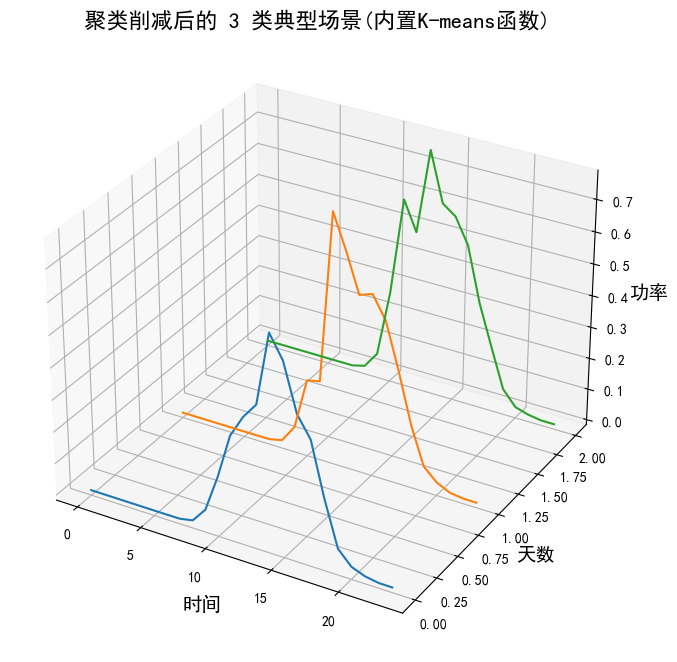

In [20]:
# 优化分析——手肘法确定聚类数K

#可视化结果
kmeans = KMeans(n_clusters=3, random_state=42)

# 拟合数据
kmeans.fit(scenarios)

# 获取聚类中心（即削减后的典型场景）和标签
reduced_scenarios3 = kmeans.cluster_centers_
labels3 = kmeans.labels_

# 绘制结果
plot_3d(reduced_scenarios3, '聚类削减后的 3 类典型场景(内置K-means函数)')

### 1.3 模型变式

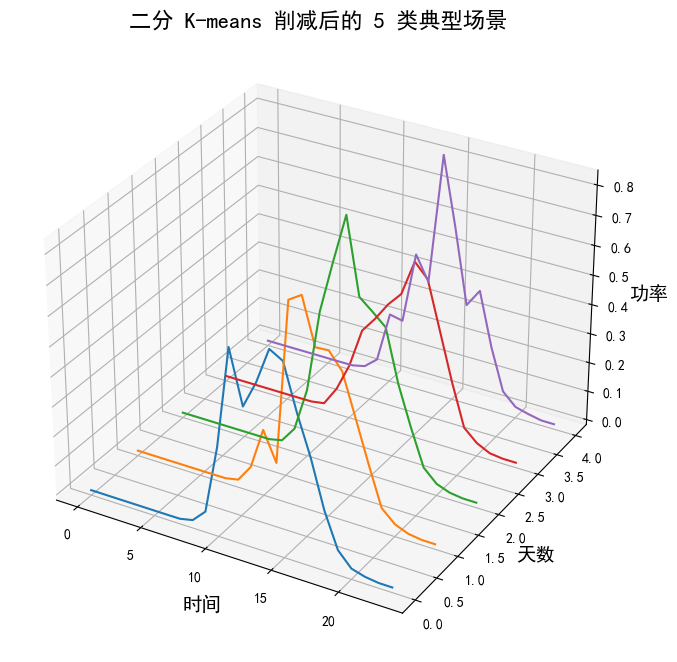

In [21]:
#  二分 K-means 算法实现

# 二分 K-means 函数
def bisecting_kmeans(scenarios, num_clusters):
    """
    二分 K-means 算法实现
    
    参数:
    scenarios (ndarray): 原始场景数据 (N, 24)
    num_clusters (int): 最终需要的聚类数量 K
    
    返回:
    centroids (ndarray): 聚类中心
    labels (ndarray): 每个点的标签
    """
    # 初始状态：将所有数据看作一个簇
    # cluster_list 存储当前所有的簇数据
    cluster_list = [scenarios]
    
    # 循环分裂，直到达到预设的簇数 K
    while len(cluster_list) < num_clusters:
        best_sse_reduction = -1
        best_cluster_idx = -1
        best_split = None
        
        # 遍历当前已有的每一个簇，尝试进行分裂
        for i, cluster in enumerate(cluster_list):
            if len(cluster) < 2:  # 样本太少无法分裂
                continue
            
            # 计算分裂前的 SSE
            sse_before = np.sum((cluster - cluster.mean(axis=0))**2)
            
            # 使用 K=2 的传统 KMeans 进行尝试性分裂
            # random_state=42 保证教学演示的可重复性
            kmeans = KMeans(n_clusters=2, n_init=10, random_state=42)
            kmeans.fit(cluster)
            
            # 获取分裂后的两个子簇
            labels = kmeans.labels_
            c1 = cluster[labels == 0]
            c2 = cluster[labels == 1]
            
            # 计算分裂后的 SSE 之和
            # kmeans.inertia_ 即为分裂后两个子簇的 SSE 之和
            sse_after = kmeans.inertia_
            
            # 计算 SSE 的减少量
            reduction = sse_before - sse_after
            
            # 寻找减少量最大的那个簇
            if reduction > best_sse_reduction:
                best_sse_reduction = reduction
                best_cluster_idx = i
                best_split = [c1, c2]
        
        # 执行“实际分裂”：移除旧簇，加入分裂后的两个新簇
        if best_split is not None:
            cluster_list.pop(best_cluster_idx)
            cluster_list.extend(best_split)
        else:
            break

    # 构造最终的聚类中心和标签
    centroids = np.array([c.mean(axis=0) for c in cluster_list])
    
    # 根据中心点重新分配原始数据的标签
    final_kmeans = KMeans(n_clusters=num_clusters, init=centroids, n_init=1)
    final_kmeans.fit(scenarios)
    
    return centroids, final_kmeans.labels_

# --- 运行二分 K-means ---
num_reduced_scenarios = 5
bi_centroids, bi_labels = bisecting_kmeans(scenarios, num_reduced_scenarios)

# 绘制结果
plot_3d(bi_centroids, f'二分 K-means 削减后的 {num_reduced_scenarios} 类典型场景')


## 2 DBSCAN算法

### 2.1 代码介绍（流程）

查看数据集前10行：
     TIMESTAMP   LOAD  TEMP
0  112009 0:00  205.0    28
1  112009 1:00  202.8    27
2  112009 2:00  202.8    27
3  112009 3:00  203.0    23
4  112009 4:00  205.7    21
5  112009 5:00  211.4    21
6  112009 6:00  220.2    19
7  112009 7:00  230.7    21
8  112009 8:00  237.2    21
9  112009 9:00  235.1    28


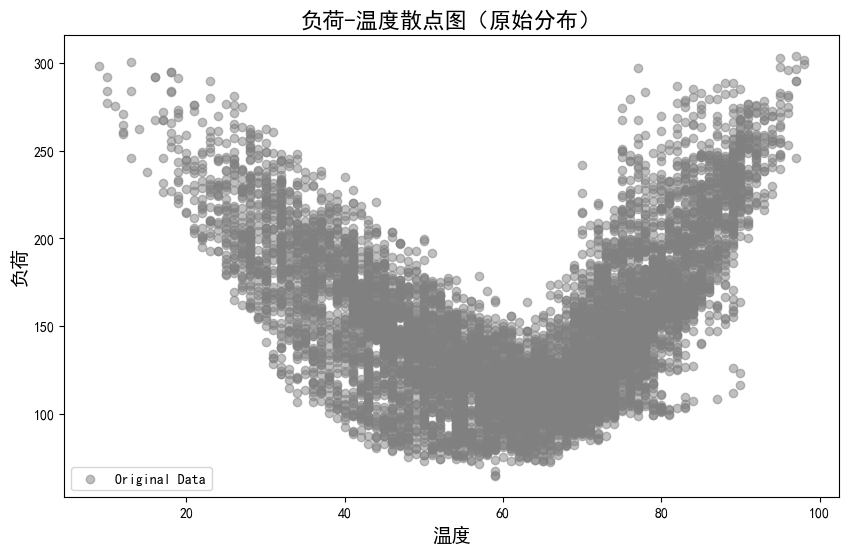

In [31]:
# 1. 初始化设置

#导入库
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

# 读取数据
df = pd.read_csv('load2009.csv')

# 查看数据集基本信息
print("="*50)
print("查看数据集前10行：")
print(df.head(10))

# 绘制原始散点图
plt.figure(figsize=(10, 6))
plt.scatter(df['TEMP'], df['LOAD'], c='gray', alpha=0.5, label='Original Data')
plt.title('负荷-温度散点图（原始分布）', fontsize=16)
plt.xlabel('温度', fontsize=14)
plt.ylabel('负荷', fontsize=14)
plt.legend()
plt.show()

# 提取负荷和温度数据
X = df[['LOAD', 'TEMP']].values

# 数据标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [32]:
# 2. 应用 DBSCAN 算法进行聚类

# 设置 DBSCAN 参数
db = DBSCAN(eps=0.13, min_samples=14)  # 调整 eps 和 min_samples 的值
labels = db.fit_predict(X_scaled)

In [33]:
# 3. 统计簇的数量和噪声点数量

n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('聚类数: %d' % n_clusters_)
print('噪声点数: %d' % n_noise_)

聚类数: 1
噪声点数: 275


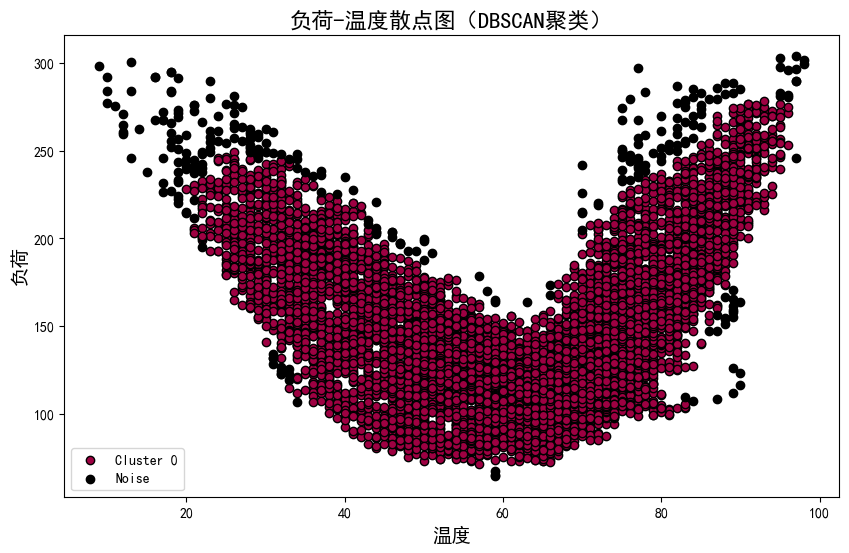

In [34]:
# 4. 绘制聚类结果散点图
plt.figure(figsize=(10, 6))
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # 黑色用于噪声点
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)
    xy = X[class_member_mask]
    plt.scatter(xy[:, 1], xy[:, 0], c=[col], edgecolor='k', label=f'Cluster {k}' if k != -1 else 'Noise')

plt.title('负荷-温度散点图（DBSCAN聚类）', fontsize=16)
plt.xlabel('温度', fontsize=14)
plt.ylabel('负荷', fontsize=14)
plt.legend()
plt.show()

In [36]:
# 5. 动态聚类过程展示
#完整代码
#为了演示流畅，仅选择数据集前100个样本进行展示

#浅灰色 (lightgray)：尚未访问过的点。
#黑色 (black)：目前的噪声点（即领域内点数不足 min\_samples）。
#彩色 (Spectral/Tab10)：已分配到特定簇的点。

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from sklearn.preprocessing import StandardScaler
from scipy.spatial import distance

# 1. 数据准备
df = pd.read_csv('load2009.csv')
# 为了演示流畅，选取前100个样本进行展示
df_subset = df.head(100).copy()

# 提取特征：[负荷, 温度]
X_orig = df_subset[['LOAD', 'TEMP']].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_orig)

# 保存标准差用于在绘图时绘制正确的搜索椭圆 (因为标准化后距离在各维度权重一致)
std_load, std_temp = np.sqrt(scaler.var_[0]), np.sqrt(scaler.var_[1])

# 2. DBSCAN 算法过程记录器 (步进式)
def get_dbscan_history(X_s, eps, min_samples):
    n_points = X_s.shape[0]
    # 状态：-2=未访问(灰色), -1=噪声(黑色), 0+=簇编号(彩色)
    labels = np.full(n_points, -2, dtype=int)
    visited = np.zeros(n_points, dtype=bool)
    history = [] # 记录每一帧的状态：(当前标签数组, 当前激活点, 搜索圆中心点)
    
    cluster_id = 0
    def find_neighbors(idx):
        dists = distance.cdist([X_s[idx]], X_s, 'euclidean').flatten()
        return np.where(dists <= eps)[0]

    for i in range(n_points):
        if visited[i]: continue
        visited[i] = True
        neighbors = find_neighbors(i)
        
        # 记录：检查新的一点
        history.append((labels.copy(), i, i))
        
        if len(neighbors) < min_samples:
            labels[i] = -1 # 暂时标记为噪声
            history.append((labels.copy(), i, i))
        else:
            labels[i] = cluster_id # 发现核心点，开始新簇
            history.append((labels.copy(), i, i))
            
            # 扩展过程：使用队列处理邻域点
            queue = [q for q in neighbors if q != i]
            while queue:
                j = queue.pop(0)
                if not visited[j]:
                    visited[j] = True
                    history.append((labels.copy(), j, j)) # 正在检查邻域点 j
                    
                    new_neighbors = find_neighbors(j)
                    if len(new_neighbors) >= min_samples:
                        for n in new_neighbors:
                            if not visited[n] and n not in queue:
                                queue.append(n)
                
                if labels[j] < 0: # 如果是未访问或之前被标为噪声的点，归入当前簇
                    labels[j] = cluster_id
                    history.append((labels.copy(), j, j))
            cluster_id += 1
    return history

# 参数设置 (可根据需要微调 eps)
eps_val = 0.25
min_samples_val = 4
history = get_dbscan_history(X_scaled, eps=eps_val, min_samples=min_samples_val)

# 3. 动画绘制设置
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_xlim(df_subset['TEMP'].min() - 2, df_subset['TEMP'].max() + 2)
ax.set_ylim(df_subset['LOAD'].min() - 10, df_subset['LOAD'].max() + 10)
ax.set_title('DBSCAN 聚类过程动态演示', fontsize=16)
ax.set_xlabel('温度 (Temperature)', fontsize=12)
ax.set_ylabel('负荷 (Load)', fontsize=12)

# 基础散点（初始全灰）
# 注意：绘图时横轴是温度[index 1], 纵轴是负荷[index 0]
scatter = ax.scatter(df_subset['TEMP'], df_subset['LOAD'], c='lightgray', s=50, edgecolors='k', linewidth=0.5)

# 搜索半径圆圈 (在原始坐标系下由于单位不同，表现为椭圆)
search_radius = patches.Ellipse((0, 0), width=eps_val*std_temp*2, height=eps_val*std_load*2, 
                                 color='red', fill=False, lw=1.5, ls='--', alpha=0.7)
ax.add_patch(search_radius)

# 活跃点标记
active_marker, = ax.plot([], [], 'ro', markersize=10, markeredgecolor='white')

# 4. 动画更新函数
def update(frame):
    current_labels, current_idx, center_idx = history[frame]
    
    # 更新点的颜色
    colors = []
    cmap = plt.cm.get_cmap('tab10', 10)
    for lab in current_labels:
        if lab == -2: colors.append('lightgray')
        elif lab == -1: colors.append('black')
        else: colors.append(cmap(lab % 10))
    scatter.set_facecolors(colors)
    
    # 更新搜索半径位置
    cx, cy = df_subset.iloc[center_idx]['TEMP'], df_subset.iloc[center_idx]['LOAD']
    search_radius.set_center((cx, cy))
    
    # 更新当前处理的点
    active_marker.set_data([df_subset.iloc[current_idx]['TEMP']], [df_subset.iloc[current_idx]['LOAD']])
    
    return scatter, search_radius, active_marker

# 创建动画 (间隔 100ms，每 2 帧取一帧以加快生成速度)
ani = FuncAnimation(fig, update, frames=range(0, len(history), 2), interval=100, blit=True)

plt.close() # 防止在 Notebook 中显示重复的静态图
HTML(ani.to_jshtml()) # 渲染动画

### 2.2 优化分析

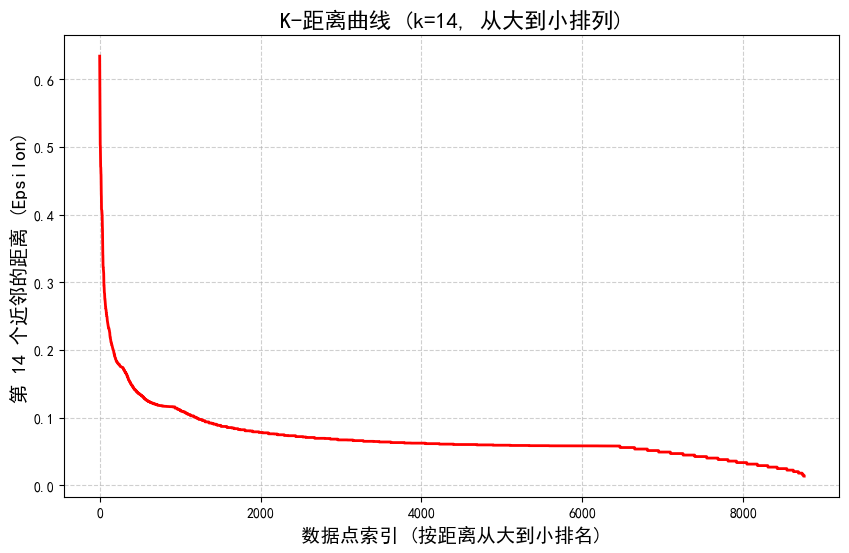

In [38]:
from sklearn.neighbors import NearestNeighbors

# 读取数据
df = pd.read_csv('load2009.csv')

# 提取负荷和温度数据
X = df[['LOAD', 'TEMP']].values

# 数据标准化
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 确定 minPts (k值)
k = 14 

# 设置 DBSCAN 参数
db = DBSCAN(eps=0.13, min_samples=14)  # 调整 eps 和 min_samples 的值
labels = db.fit_predict(X_scaled)

# 计算每个点到其第 k 个最近邻居的距离
neigh = NearestNeighbors(n_neighbors=k)
nbrs = neigh.fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)

# 对距离进行从大到小排序
# distances[:, k-1] 提取第k个近邻的距离
# [::-1] 表示将从小到大的数组进行翻转，变为从大到小
k_distances_desc = np.sort(distances[:, k-1], axis=0)[::-1]

# 绘制 K-距离曲线（从大到小排列）
plt.figure(figsize=(10, 6))
plt.plot(k_distances_desc, color='red', linewidth=2)

# 图表装饰
plt.title(f'K-距离曲线 (k={k}, 从大到小排列)', fontsize=16)
plt.xlabel('数据点索引 (按距离从大到小排名)', fontsize=14)
plt.ylabel(f'第 {k} 个近邻的距离 (Epsilon)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.6)

plt.show()

## 3 自组织映射算法

### 3.1 代码介绍（流程）

In [39]:
# 1. 初始化设置

#导入库
import pandas as pd
from minisom import MiniSom
import matplotlib.pyplot as plt

# 读取 CSV 文件
file_path = 'wind2012.csv'
data_df = pd.read_csv(file_path)

# 查看数据集基本信息
print("="*50)
print("查看数据集前10行：")
print(df.head(10))

# 数据预处理
# 提取特征列和目标列
features = data_df[['U10', 'V10', 'U100', 'V100']].values
target = data_df['TARGETVAR'].values
# 对特征数据进行标准化处理
features = (features - features.mean(axis=0)) / features.std(axis=0)

查看数据集前10行：
     TIMESTAMP   LOAD  TEMP
0  112009 0:00  205.0    28
1  112009 1:00  202.8    27
2  112009 2:00  202.8    27
3  112009 3:00  203.0    23
4  112009 4:00  205.7    21
5  112009 5:00  211.4    21
6  112009 6:00  220.2    19
7  112009 7:00  230.7    21
8  112009 8:00  237.2    21
9  112009 9:00  235.1    28


In [40]:
# 2. 初始化 SOM 模型

som_shape = (10, 10)  # SOM 网络的形状
input_len = features.shape[1]  # 输入数据的维度
sigma = 1.0  # 邻域半径
learning_rate = 0.5  # 学习率

som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate)

In [37]:
# 3. 训练 SOM 模型

num_iterations = 1000  #训练迭代次数
som.train_random(features, num_iterations)

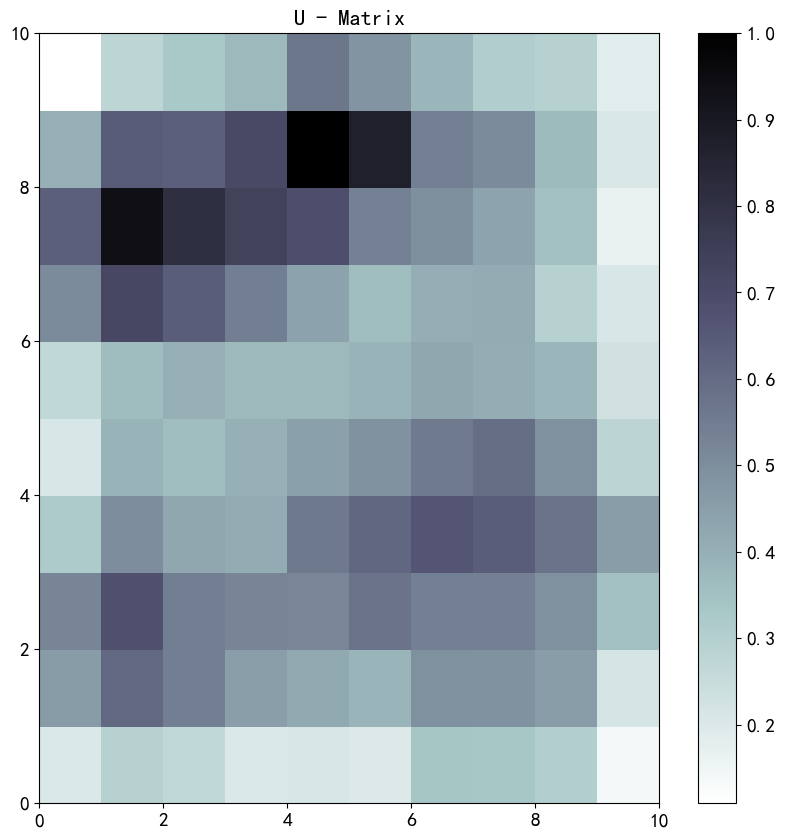

In [38]:
# 4. 可视化分析

# 4.1 统一距离矩阵（U - Matrix）

#绘图代码
plt.figure(figsize=(10, 10))

# 绘制矩阵
plt.pcolor(som.distance_map().T, cmap='bone_r')

# 设置颜色条 (Colorbar) 及其标签字体
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)  # 颜色条刻度字体大小

# 设置坐标轴刻度数字的大小
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#设置标题
plt.title('U - Matrix', fontsize=16)
plt.show()

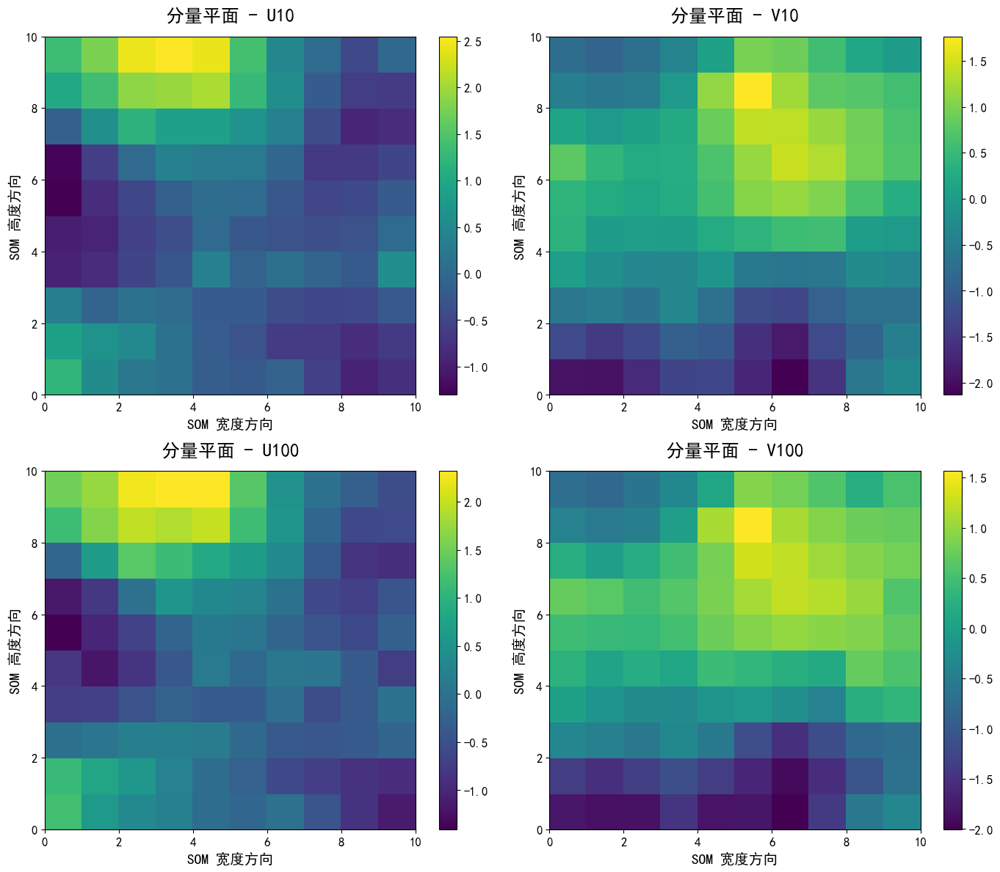

In [39]:
# 4.2 分量平面可视化  
# 分量平面可以帮助我们观察不同特征与 SOM 网格节点之间的关系

# 创建一个画布
plt.figure(figsize=(14, 12))

feature_names = ['U10', 'V10', 'U100', 'V100']

for i, var in enumerate(feature_names):
    # 指定当前绘制第 i+1 个子图 (2x2 布局中的位置)
    plt.subplot(2, 2, i + 1)
    
    # 提取第 i 个特征的权重数据并转置
    # som.get_weights() 的维度通常是 (width, height, dim)
    weights = som.get_weights()[:, :, i].T
    
    # 绘制伪彩色图
    plt.pcolor(weights, cmap='viridis')
    
    # 添加颜色条，并设置刻度字体大小
    cb = plt.colorbar()
    cb.ax.tick_params(labelsize=12)
    
    # 设置子图标题
    plt.title(f'分量平面 - {var}', fontsize=18, pad=15)
    
    # 设置子图坐标轴标签字体大小
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('SOM 宽度方向', fontsize=14)
    plt.ylabel('SOM 高度方向', fontsize=14)

# 自动调整子图间距，防止标题和坐标轴重叠
plt.tight_layout()
plt.show()

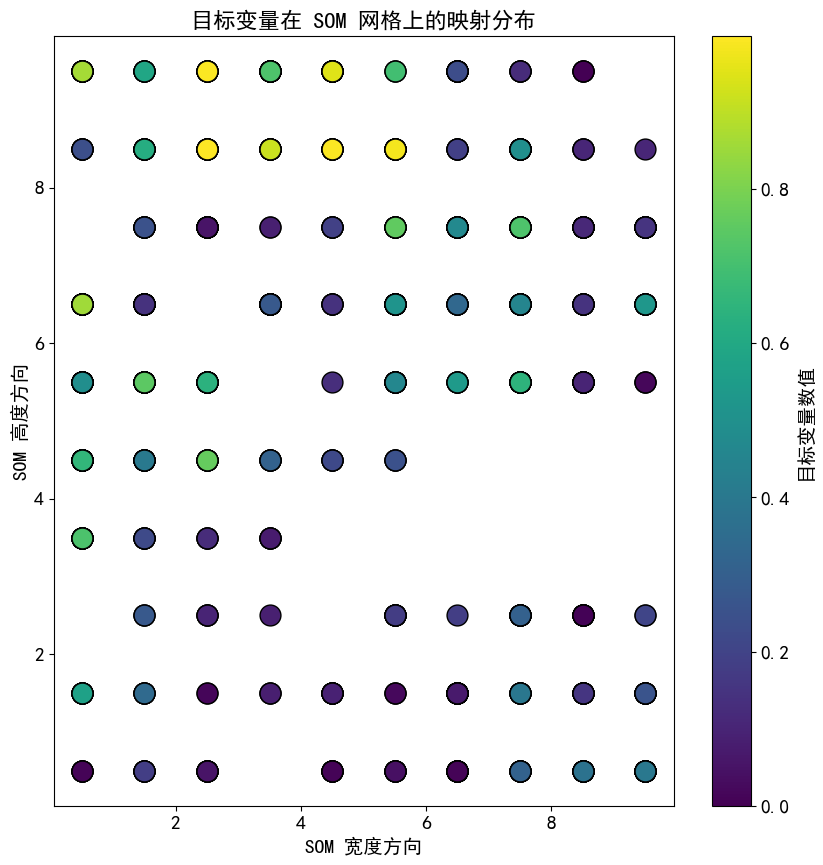

In [40]:
# 4.3 样本映射图
#样本映射到 SOM 节点并可视化目标变量（如功率/负荷）

# 将目标变量进行归一化处理，映射到 [0, 1] 区间，以便直接对应颜色表的颜色
target_normalized = (target - target.min()) / (target.max() - target.min())

# 创建画布
plt.figure(figsize=(10, 10))

# 遍历特征数据集中的每一个样本点
for cnt, xx in enumerate(features):
    # 使用 SOM 模型找到该样本对应的“获胜神经元”（即距离最近的网格节点坐标）
    w = som.winner(xx)  
    
    # 在对应的网格位置绘制圆圈：
    # w[0] + 0.5 和 w[1] + 0.5：将点画在网格方块的中心位置
    # 'o'：指定绘制圆圈形状
    # markerfacecolor：圆圈内部颜色，根据样本归一化后的目标值从 viridis 颜色映射表中取色
    # markeredgecolor='k'：设置圆圈边缘颜色为黑色 (k=black)
    # markersize=15：圆圈的大小，方便视觉观察
    # markeredgewidth=1：边缘线条的宽度
    plt.plot(w[0] + 0.5, w[1] + 0.5, 'o', 
             markerfacecolor=plt.cm.viridis(target_normalized[cnt]),
             markeredgecolor='k', markersize=15, markeredgewidth=1)

# 设置图像标题
plt.title('目标变量在 SOM 网格上的映射分布', fontsize=16)

# 设置坐标轴标签
plt.xlabel('SOM 宽度方向', fontsize=14)
plt.ylabel('SOM 高度方向', fontsize=14)

# 设置坐标轴刻度标签的字体大小
plt.tick_params(axis='both', which='major', labelsize=14)

# 创建一个 ScalarMappable 对象，用于生成与之匹配的颜色条 (Colorbar)
# 指定颜色映射方案 (cmap) 和数值的归一化范围 (norm)
sm = plt.cm.ScalarMappable(cmap='viridis', 
                           norm=plt.Normalize(vmin=target.min(), vmax=target.max()))
sm.set_array([]) # 必须设置空数组以满足 Matplotlib 的要求

# 获取当前的坐标轴，并在其旁边添加颜色条
ax = plt.gca()
cb = plt.colorbar(sm, ax=ax)

# 设置颜色条侧边的数字标签大小
cb.ax.tick_params(labelsize=14)
cb.set_label('目标变量数值', fontsize=14) # 给颜色条添加说明

# 10. 展示最终生成的映射图
plt.show()

### 3.2 优化分析

In [25]:
#SOM优化分析——SOM 的权重初始化

# 1. 随机初始化

#与原来代码相同
som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate)
som.train_random(features, num_iterations)

# 训练完成后计算指标
q_error = som.quantization_error(features)
t_error = som.topographic_error(features)

print(f"随机初始化")
print(f"量化误差 (QE): {q_error:.4f}")
print(f"拓扑误差 (TE): {t_error:.4f}")

随机初始化
量化误差 (QE): 0.2297
拓扑误差 (TE): 0.1696


In [26]:
# 2. 样本初始化

som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate)
som.random_weights_init(features) # 在 train 之前加入这一行，从训练数据 features 中随机挑选 10 × 10 = 100个点作为初始神经元
som.train_random(features, num_iterations)

# 训练完成后计算指标
q_error = som.quantization_error(features)
t_error = som.topographic_error(features)

print(f"样本初始化")
print(f"量化误差 (QE): {q_error:.4f}")
print(f"拓扑误差 (TE): {t_error:.4f}")

样本初始化
量化误差 (QE): 0.2320
拓扑误差 (TE): 0.3472


In [27]:
# 3. PCA 初始化

som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate)
som.pca_weights_init(features) # 根据数据的主成分分布来拉伸初始网格
som.train_random(features, num_iterations)

# 训练完成后计算指标
q_error = som.quantization_error(features)
t_error = som.topographic_error(features)

print(f"PCA 初始化")
print(f"量化误差 (QE): {q_error:.4f}")
print(f"拓扑误差 (TE): {t_error:.4f}")

PCA 初始化
量化误差 (QE): 0.2143
拓扑误差 (TE): 0.0444


高斯函数
量化误差 (QE): 0.2490
拓扑误差 (TE): 0.2544


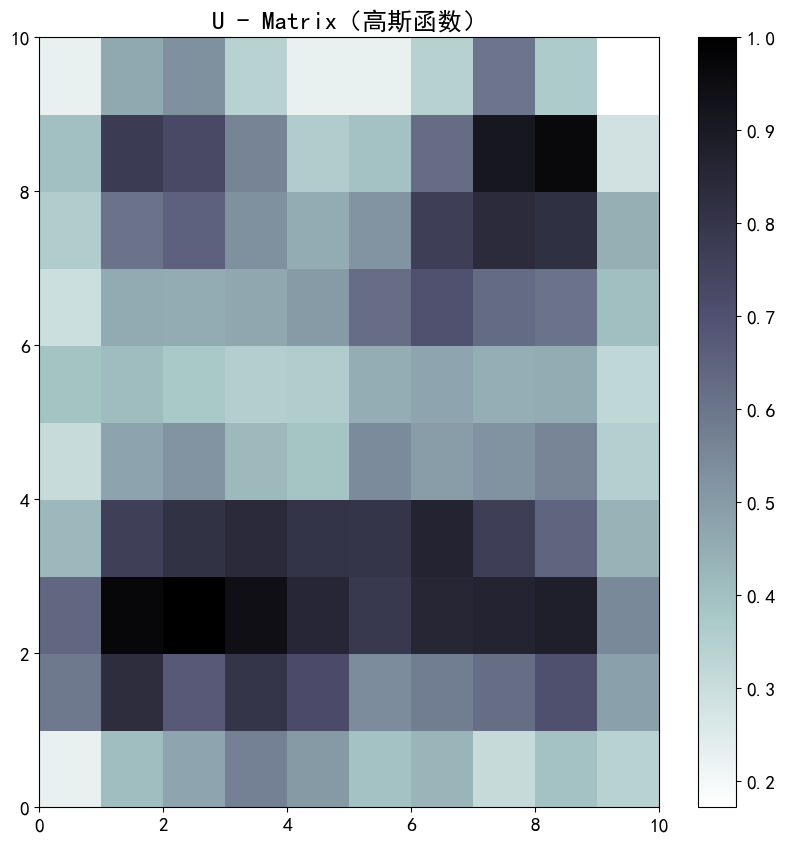

In [28]:
#SOM优化分析——邻域函数选择

# 1. 高斯函数

# 原来代码默认为使用高斯函数
som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate)
som.train_random(features, num_iterations)

# 训练完成后计算指标
q_error = som.quantization_error(features)
t_error = som.topographic_error(features)

print(f"高斯函数")
print(f"量化误差 (QE): {q_error:.4f}")
print(f"拓扑误差 (TE): {t_error:.4f}")

# 绘制 U - Matrix 图
plt.figure(figsize=(10, 10))

# 绘制矩阵
plt.pcolor(som.distance_map().T, cmap='bone_r')

# 设置颜色条 (Colorbar) 及其标签字体
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)  # 颜色条刻度字体大小

# 设置坐标轴刻度数字的大小
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#设置标题
plt.title('U - Matrix（高斯函数）', fontsize=18)
plt.show()

Bubble函数
量化误差 (QE): 0.3882
拓扑误差 (TE): 0.9664


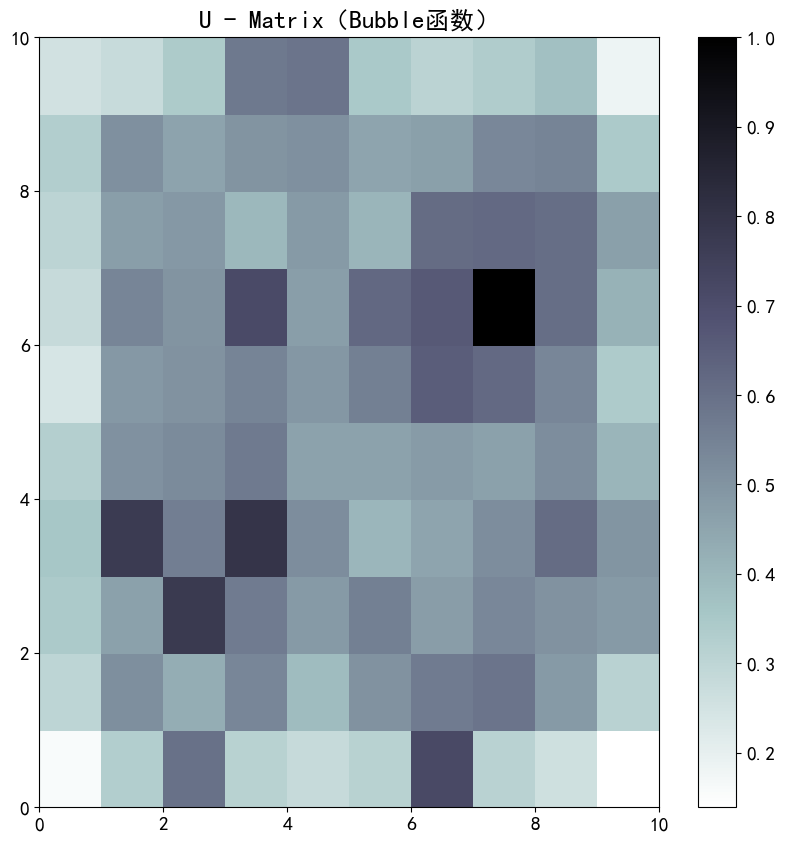

In [29]:
# 2. Bubble函数

# Bubble函数
som = MiniSom(som_shape[0], som_shape[1], input_len, sigma=sigma, learning_rate=learning_rate, neighborhood_function='bubble')
som.train_random(features, num_iterations)

# 训练完成后计算指标
q_error = som.quantization_error(features)
t_error = som.topographic_error(features)

print(f"Bubble函数")
print(f"量化误差 (QE): {q_error:.4f}")
print(f"拓扑误差 (TE): {t_error:.4f}")

# 绘制 U - Matrix 图
plt.figure(figsize=(10, 10))

# 绘制矩阵
plt.pcolor(som.distance_map().T, cmap='bone_r')

# 设置颜色条 (Colorbar) 及其标签字体
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)  # 颜色条刻度字体大小

# 设置坐标轴刻度数字的大小
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#设置标题
plt.title('U - Matrix（Bubble函数）', fontsize=18)
plt.show()